# Proyecto Final PDS 
## Jesús David Mercado Machado 
## C.C:1010118877

In [1]:
#Librerias Necesarias 
import numpy as np;
import matplotlib.pyplot as plt;
import librosa;
import pywt;
import scipy.fftpack as fourier
import librosa.display;
from scipy.signal import kaiserord, lfilter, firwin, freqz;
from scipy.io.wavfile import read
import IPython.display as ipd
import scipy.signal as sp

# 1. Filtrado Wavelet 
El proceso de filtrado wavelet se resume en los siguientes pasos:

* Generación u obtencion de una señal.
* Descomposición wavelet y obtención de los coeficientes de la descomposición: Es el punto mas importante del proceso ya que en el se descompone la funcion en las diferentes escalas
* Aplicación de un umbral: Sirve para eliminar o atenuar coeficientes considerados ruido o de poca importancia.
* Reconstrucción de la señal utilizando los coeficientes umbralizados.

En resumen, el filtrado wavelet implica descomponer la señal en diferentes componentes de frecuencia y luego reconstruir una versión filtrada de la señal utilizando los coeficientes umbralizados. Esto permite eliminar ruido, resaltar características importantes y comprimir la señal de manera más eficiente.







### 1.1  Cree dos señales sinusoidales con componentes de frecuencia diferentes y grafique tanto en el tiempo como el espectro correspondiente.

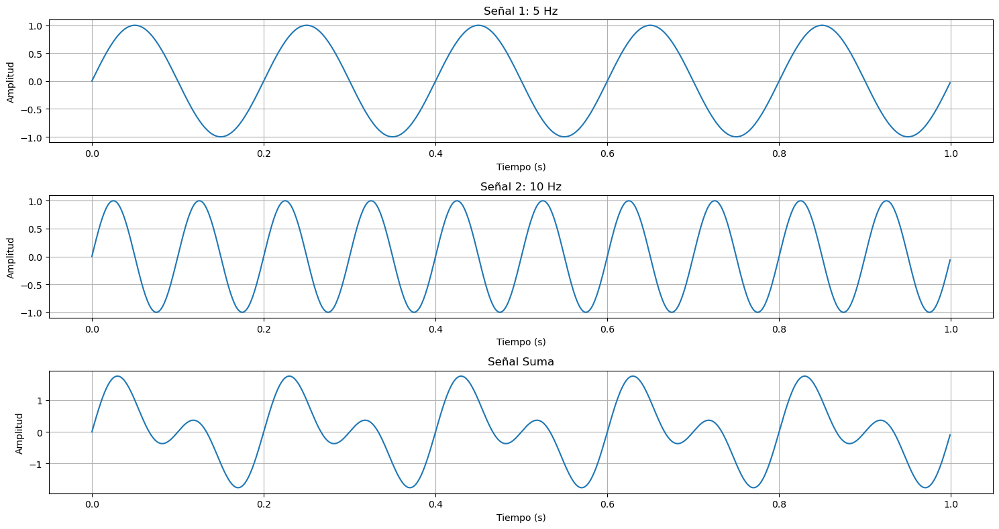

In [2]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la señal
fs = 1000  # Frecuencia de muestreo (Hz)
t = np.arange(0, 1, 1/fs)  # Vector de tiempo

# Generación de señales sinusoidales
f1 = 5  # Frecuencia de la primera señal (Hz)
f2 = 10  # Frecuencia de la segunda señal (Hz)
signal1 = np.sin(2*np.pi*f1*t)
signal2 = np.sin(2*np.pi*f2*t)

# Suma de las señales
signal_sum = signal1 + signal2

# Gráfico de las señales
plt.figure(figsize=(15, 8))
plt.subplot(3, 1, 1)
plt.plot(t, signal1)
plt.title('Señal 1: 5 Hz')
plt.xlabel('Tiempo (s)')
plt.ylabel('Amplitud')
plt.grid()
plt.subplot(3, 1, 2)
plt.plot(t, signal2)
plt.title('Señal 2: 10 Hz')
plt.xlabel('Tiempo (s)')
plt.ylabel('Amplitud')
plt.grid()

plt.subplot(3, 1, 3)
plt.plot(t, signal_sum)
plt.title('Señal Suma')
plt.xlabel('Tiempo (s)')
plt.ylabel('Amplitud')
plt.grid()
plt.tight_layout()
plt.show()



### 1.2 Añadale ruido blanco a la suma de las señales y grafique tanto el tiempo como en la frecuencia  ¿Que diferencias puede apreciar en los espectros originales y con ruido ?

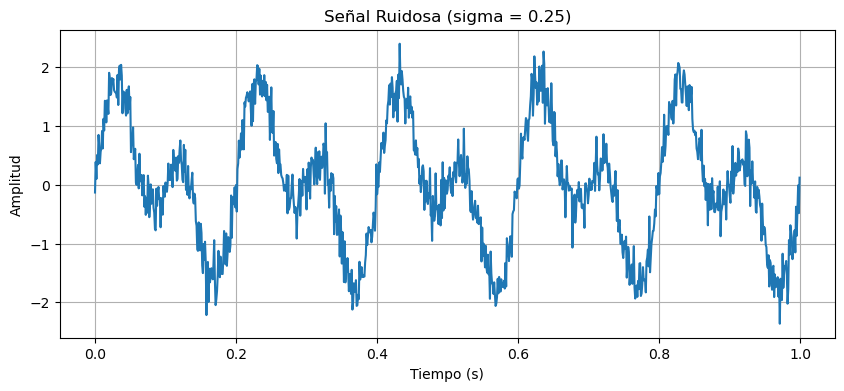

In [3]:
# Agregar ruido gaussiano
sigma = 0.25
noise = np.random.normal(0, sigma, len(signal_sum))
signal_noisy = signal_sum + noise

# Gráfico de la señal ruidosa
plt.figure(figsize=(10, 4))
plt.plot(t, signal_noisy)
plt.title('Señal Ruidosa (sigma = 0.25)')
plt.xlabel('Tiempo (s)')
plt.ylabel('Amplitud')
plt.grid()
plt.show()


### 1.3 Realice la descomponsion de la señal, la umbralizacion y apliquelo.

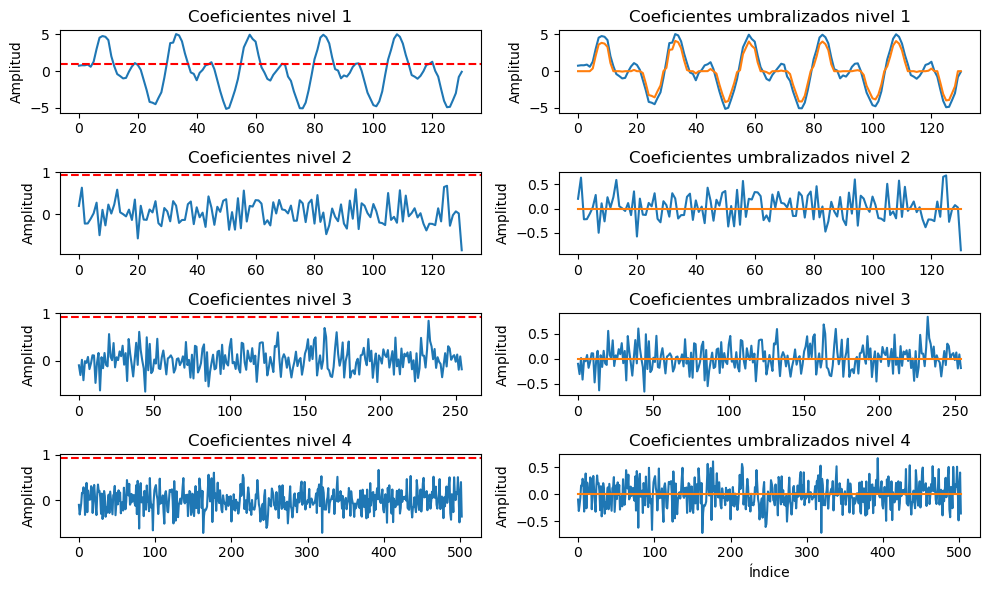

In [4]:
import pywt
# Descomposición wavelet
wavelet = 'db4'
level = 3 # niveles de descomposicion
coeffs = pywt.wavedec(signal_noisy, wavelet, level=level)

# Cálculo del umbral
threshold = sigma * np.sqrt(2 * np.log(len(signal_noisy)))

# Aplicar umbral a los coeficientes
thresholded_coeffs = []
for i, c in enumerate(coeffs):
    thresholded = pywt.threshold(c, threshold, 'soft')
    thresholded_coeffs.append(thresholded)

# Gráfico de los coeficientes wavelet y umbral
plt.figure(figsize=(10, 6))

for i, c in enumerate(coeffs):
    plt.subplot(level+1, 2, 2*i+1)
    plt.plot(c)
    plt.title('Coeficientes nivel {}'.format(i+1))
    plt.ylabel('Amplitud')
     # Línea de umbral
    plt.axhline(threshold, color='r', linestyle='--', label='Umbral')
    plt.subplot(level+1, 2, 2*i+2)
    plt.plot(c)
    plt.title('Coeficientes nivel {} (Umbral)'.format(i+1))
    plt.ylabel('Amplitud')
    
    plt.subplot(level+1, 2, 2*i+2)
    plt.plot(thresholded_coeffs[i])
    plt.title('Coeficientes umbralizados nivel {}'.format(i+1))
    plt.ylabel('Amplitud')

plt.xlabel('Índice')
plt.tight_layout()
plt.show()


### 1.4 Reconstruya la señal y grafique tanto la señal original como la reconstruida

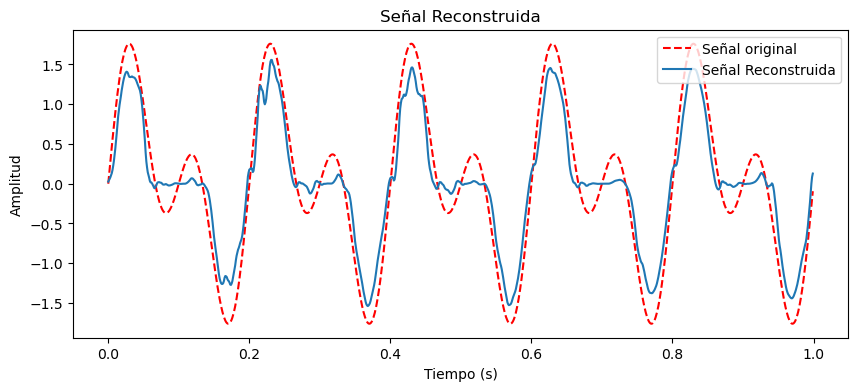

In [5]:
# Reconstrucción de la señal
reconstructed_signal = pywt.waverec(thresholded_coeffs, wavelet)

# Gráfico de la señal reconstruida
plt.figure(figsize=(10, 4))
plt.plot(t,signal_sum, color='r', linestyle='--', label='Señal original')
plt.plot(t, reconstructed_signal,label='Señal Reconstruida')
plt.title('Señal Reconstruida')
plt.xlabel('Tiempo (s)')
plt.ylabel('Amplitud')
plt.legend(loc='upper right')
plt.show()


Como podemos ver en la grafica, el filtrado fue excelente, nos dio una representacion muy cercana a la original teniendo en cuenta todo el ruido que tenia la señal original

# 2. Filtrado De Audio Ruidoso

Haremos uso de lo aprendido en el punto 1, para convertir un audio con mucho ruido a algo que se pueda entender.

### 2.1 Leea, grafique tanto en el tiempo como en frecuecia el audio adjunto y reproduzcalo¿ logra apreciar algo en el audio o en el espectro?

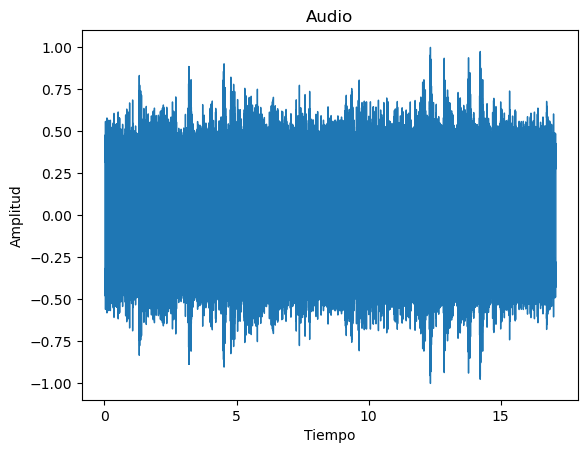

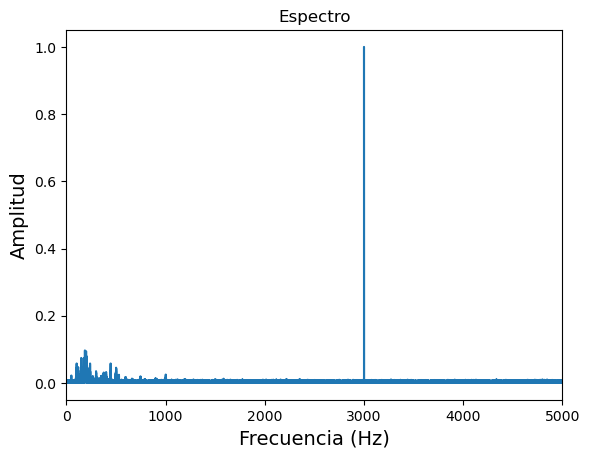

In [6]:
file_audio=('audio.wav') # Ruta del archivo con la senal
fs, signal=read(file_audio) # Cargar el archivo
signal=signal/float(max(abs(signal))) # escala la amplitud de la senal 
t=np.arange(0, len(signal)/fs, 1.0/fs) # Vector de tiempo

#Grafica en el tiempo
librosa.display.waveshow(signal, sr=fs); #Mostramos grafica
plt.title('Audio')
plt.xlabel('Tiempo')
plt.ylabel('Amplitud')
plt.show()
#Espectro de la señal
gk = np.fft.fft(signal)
M_gk = abs(gk) / max(abs(gk))                                 # Calculamos la Magnitud de la FFT
x_freq=np.fft.fftfreq(len(signal))*fs
plt.plot(x_freq, M_gk)
plt.title('Espectro')
plt.xlabel('Frecuencia (Hz)', fontsize='14')
plt.ylabel('Amplitud', fontsize='14')
plt.xlim(0,5000)
plt.show()
#Audio
ipd.Audio(signal, rate=fs)

En el audio muy poco se llega apreciar el sonido de una guitarra, un pitido constante y ruido. Del espectro me puedo dar cuenta que tenemos un pico de frecuencia en 3000 Hz y picos distribuidos de menor amplitud en el rango de 0HZ a aproximadamente 2000 Hz. Lo que puede indicar que el pitido se encuentra en la frecuencia de 3000Hz, por lo que lo eliminaremos haciendo uso de un filtro pasabajas.

### 2.2 Teniendo en cuenta el espectro realice un filtro pasabajos, que quite el pico de frecuencia. paso a paso sin usar funciones de python y realice una comparacion con enventanado y sin el.

In [7]:
#Funcion que determina la ventana a usar dependiendo del ripple escogido

def getM(ripple_dB, Fs, fm):
    M = 0
    if 54<= abs(ripple_dB) <= 74:
        print("Ventana de blackman")
        M = 6*Fs/fm
    elif 22<= abs(ripple_dB) <= 53:
        print("Ventana de hamming")
        M = 4*Fs/fm
    elif 0<= abs(ripple_dB) <= 21:
        print("Venta Rectangular")
        M = 2*Fs/fm - 1
    if M % 2 == 0:
        M += 1
    return int(M)

#Diseño del filtro
#Encontramos el orden del filtro
fm =200 # Ancho de banda de transición  
Fc=2000 # Frecuencia de corte
rp=0.003
wc = (2*np.pi*Fc)/fs       #Frecuencia de corte normalizada en radianes

rpdb=20*np.log10(rp) # ripple en db


print("Ripple en dB:", rpdb)
M = getM(rpdb, fs, fm)
print('Orden del filtro:', M)

Ripple en dB: -50.45757490560675
Ventana de hamming
Orden del filtro: 441


In [8]:
#Creación de la ventana
n = np.arange(-(M-1)/2,M/2)  #Vector de muestras

hi = (wc/np.pi)*np.sinc((wc*n)/np.pi) #Respuesta del filtro ideal

win = 0.54-0.46*np.cos(2*np.pi*np.arange(len(n))/(M-1)) # Ventana de Hamming

h = hi*win                  #Multiplico la respuesta ideal por la ventana

w_sv,Hh_sv = sp.freqz(hi,1, whole=True, worN=2048) #Respuesta en frecuencia del filtro sin eventanado

w, Hh = sp.freqz(h,1, whole=True, worN=2048) #Respuesta en frecuencia del filtro enventanado

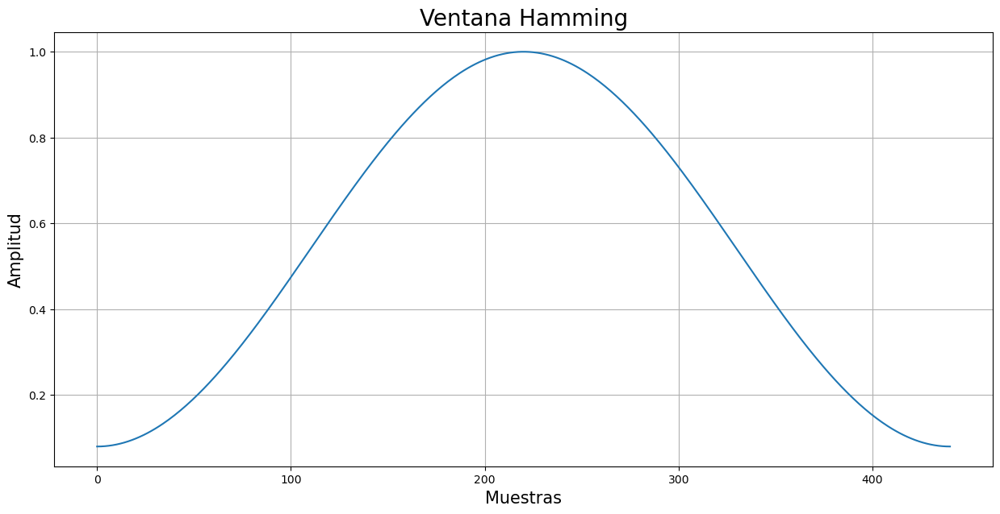

In [9]:
# Grafica ventana Hamming
n=np.arange(0,M,1) # tamaño vector temporal vuelve la ventana causal
plt.figure(figsize=(15,7))
plt.plot(n,win)
plt.title("Ventana Hamming",fontsize=20)
plt.xlabel("Muestras",fontsize=15)
plt.ylabel("Amplitud",fontsize=15)
plt.grid()
plt.show()

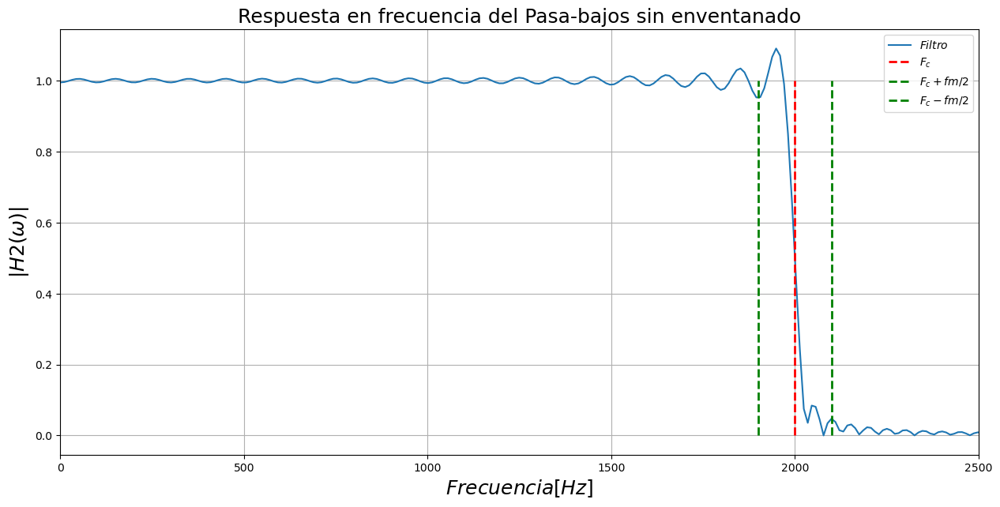

In [10]:
#Gráfica del filtro para mirar comportamiento sin enventanado
plt.figure(figsize=(15,7))
plt.title('Respuesta en frecuencia del Pasa-bajos sin enventanado', fontsize=18)
plt.plot((w_sv -np.pi)*fs/(2*np.pi), np.abs(np.fft.fftshift(Hh_sv)), label='$Filtro$')
plt.vlines(Fc, 0, 1, color='r', lw=2, linestyle='--',label='$F_c$')
plt.vlines(Fc+fm/2, 0, 1, color='g', lw=2, linestyle='--',label='$F_c+fm/2$')
plt.vlines(Fc-fm/2, 0, 1, color='g', lw=2, linestyle='--',label='$F_c-fm/2$')
plt.xlim([-0,2500])
plt.xlabel("$Frecuencia [Hz]$", fontsize=18)
plt.ylabel("$|H2(\omega)|$", fontsize=18)
plt.legend()
plt.grid()
plt.show()

De la grafica se puede apreciar un rizada muy predominante tanto en la banda pasante, como en la banda atenuada

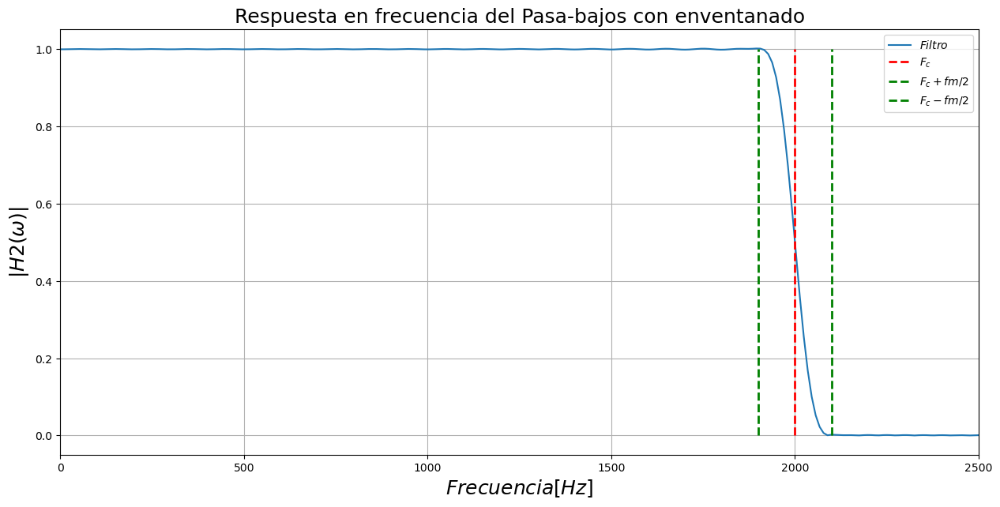

In [11]:
#Gráfica del filtro para mirar comportamiento
plt.figure(figsize=(15,7))
plt.title('Respuesta en frecuencia del Pasa-bajos con enventanado', fontsize=18)
plt.plot((w-np.pi)*fs/(2*np.pi), np.abs(np.fft.fftshift(Hh)), label='$Filtro$')
plt.vlines(Fc, 0, 1, color='r', lw=2, linestyle='--',label='$F_c$')
plt.vlines(Fc+fm/2, 0, 1, color='g', lw=2, linestyle='--',label='$F_c+fm/2$')
plt.vlines(Fc-fm/2, 0, 1, color='g', lw=2, linestyle='--',label='$F_c-fm/2$')
plt.xlim([-0,2500])
plt.xlabel("$Frecuencia [Hz]$", fontsize=18)
plt.ylabel("$|H2(\omega)|$", fontsize=18)
plt.legend()
plt.grid()
plt.show()

Podemos ver que el rizado casi se eliminado por completo en la ventana de hamming y posee un roll-off mayor 

### 2.3 Aplique las ventanas al audio que diferencias logra apreciar?

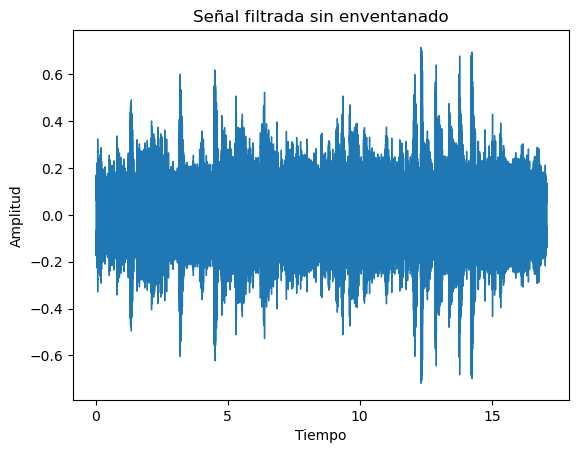

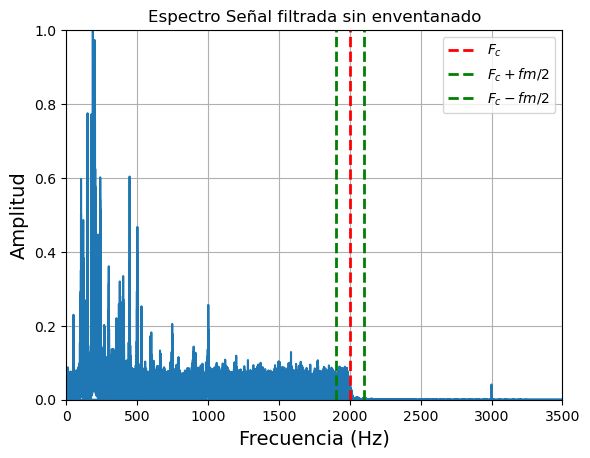

In [12]:
y_1 = np.convolve(signal, hi, mode='same')       #Sin enventanado
#Graficamos en el tiempo
librosa.display.waveshow(y_1, sr=fs); #Mostramos grafica
plt.title('Señal filtrada sin enventanado')
plt.xlabel('Tiempo')
plt.ylabel('Amplitud')
plt.show()
ipd.Audio(y_1, rate=fs)
#Graficamos el espectro
gk = np.fft.fft(y_1)
M_gk = abs(gk)/max(abs(gk))                                  # Calculamos la Magnitud de la FFT
x_freq=np.fft.fftfreq(len(y_1))*fs
plt.plot(x_freq, M_gk)
plt.vlines(Fc, 0, 1, color='r', lw=2, linestyle='--',label='$F_c$')
plt.vlines(Fc+fm/2, 0, 1, color='g', lw=2, linestyle='--',label='$F_c+fm/2$')
plt.vlines(Fc-fm/2, 0, 1, color='g', lw=2, linestyle='--',label='$F_c-fm/2$')
plt.title('Espectro Señal filtrada sin enventanado')
plt.xlabel('Frecuencia (Hz)', fontsize='14')
plt.ylabel('Amplitud', fontsize='14')
plt.ylim(0,1)
plt.xlim(0,3500)
plt.legend()
plt.grid()
plt.show()
ipd.Audio(y_1, rate=fs)

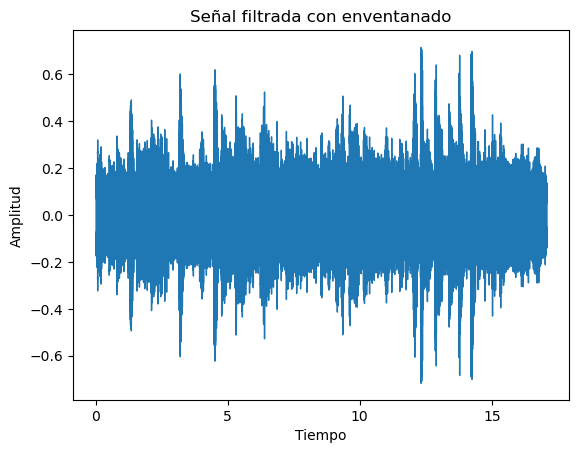

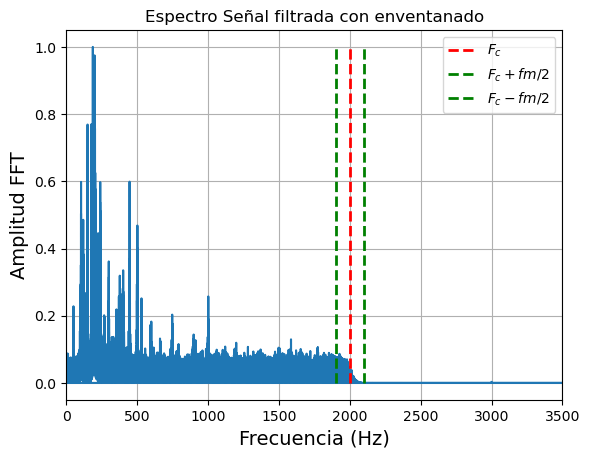

In [13]:
y_2 = np.convolve(signal, h, mode='same')       #Sin enventanado

#Graficamos en el tiempo
librosa.display.waveshow(y_2, sr=fs); #Mostramos grafica
plt.title('Señal filtrada con enventanado')
plt.xlabel('Tiempo')
plt.ylabel('Amplitud')
plt.show()
ipd.Audio(y_2, rate=fs)
#Graficamos el espectro
gk1 = np.fft.fft(y_2)
M_gk1 = abs(gk1)/max(abs(gk1))                                  # Calculamos la Magnitud de la FFT
x_freq1=np.fft.fftfreq(len(y_2))*fs
plt.plot(x_freq1, M_gk1)
plt.vlines(Fc, 0, 1, color='r', lw=2, linestyle='--',label='$F_c$')
plt.vlines(Fc+fm/2, 0, 1, color='g', lw=2, linestyle='--',label='$F_c+fm/2$')
plt.vlines(Fc-fm/2, 0, 1, color='g', lw=2, linestyle='--',label='$F_c-fm/2$')
plt.title('Espectro Señal filtrada con enventanado')
plt.xlabel('Frecuencia (Hz)', fontsize='14')
plt.ylabel('Amplitud FFT', fontsize='14')
#plt.ylim(0,1)
plt.xlim(0,3500)
plt.legend()
plt.grid()
plt.show()
ipd.Audio(y_2, rate=fs)

En el espectro se puede observar un roll-off del filtro sin enventanado mas rapido ademas de que no elimino por completo el pitido en los 3000Hz tambien debido a la baja atenuacion de su banda atenuada. Mientras que en el filtro con la ventana de hamming se nota un roll-off mayor, pero una mejor atenuacion que logra eliminar por completo el pitido de los 3000 Hz

## 2.4 utilizando la siguiente funcion apliquele un filtro wavelet al audio filtrado con la ventana escogida.

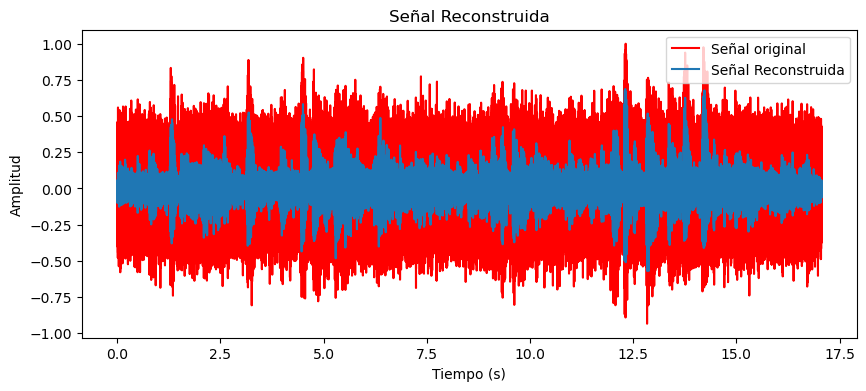

In [14]:
t=np.arange(0, len(signal)/fs, 1.0/fs) # Vector de tiempo
#Funcion
def wnoisest(coeff):
    stdc = np.zeros((len(coeff),1))
    for i in range(0, len(coeff)):
        stdc[i] = (np.median(np.absolute(coeff[i]))) / 0.6745
    return stdc

def threshold(coeff):
    Num_samples = 0
    for i in range(0, len(coeff)):
        Num_samples = Num_samples + coeff[i].shape[0]
    
    thr = np.sqrt(2 * (np.log(Num_samples)))
    return thr

def wthresh(coeff):
    y = []
    s = wnoisest(coeff)
    thr = threshold(coeff)
    for i in range(0, len(coeff)):
        y.append(np.multiply(coeff[i], np.abs(coeff[i]) > (thr * s[i])))
    return thr, s, y


wavelet = 'db4'
level = 4

# Descomposición wavelet
coeffs = pywt.wavedec(y_2, wavelet, level=level)

# Llamada a la función wthresh()
thr, s, thresholded_coeffs = wthresh(coeffs[1:])

# Reconstrucción de los coeficientes con el umbral aplicado
coeffs[1:] = thresholded_coeffs

# Reconstrucción de la señal
reconstructed_signal = pywt.waverec(coeffs, wavelet)
# Gráfico de la señal reconstruida
plt.figure(figsize=(10, 4))
plt.plot(t,signal, color='r', label='Señal original')
plt.plot(t, reconstructed_signal,label='Señal Reconstruida')
plt.title('Señal Reconstruida')
plt.xlabel('Tiempo (s)')
plt.ylabel('Amplitud')
plt.legend(loc='upper right')
plt.show()

ipd.Audio(reconstructed_signal, rate=fs)

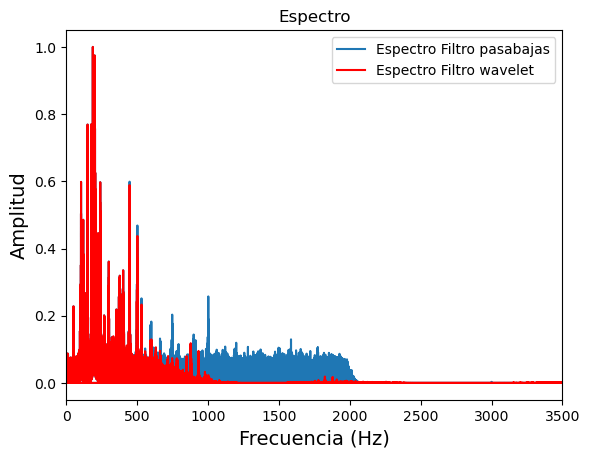

In [15]:
gk = np.fft.fft(reconstructed_signal)
M_gk = abs(gk)/max(abs(gk))                                  # Calculamos la Magnitud de la FFT
x_freq=np.fft.fftfreq(len(reconstructed_signal))*fs
plt.title('Espectro')
plt.plot(x_freq1, M_gk1,label="Espectro Filtro pasabajas")
plt.plot(x_freq, M_gk, color='r',label="Espectro Filtro wavelet")
plt.legend(loc="upper right")
plt.xlabel('Frecuencia (Hz)', fontsize='14')
plt.ylabel('Amplitud', fontsize='14')
plt.xlim(0,3500)
plt.show()

Como se puede apreciar tanto en el espectro como el audio es una reduccion considerable del ruido, donde en el audio podemos apreciar claramente el sonido de la guitarra y en el espectro se ve la eliminacion completa de un bloque muy ruidoso y el realce de otras componentes que contenian ruido antes.

# 3. Filtros aplicados a la reduccion de ruido cardiaco en respiracion

En el presente escenario, nos enfrentamos a la tarea de extraer una señal de interés que se encuentra enmascarada por ruido en nuestra señal principal, la cual representa un examen realizado con un estetoscopio digital. Para lograr este objetivo, se requiere seguir un procedimiento compuesto por etapas fundamentales.

En primer lugar, es necesario aplicar un proceso de filtrado extrategico con el fin de reducir su amplitud y destacar así la presencia del "ruido". Esta etapa de atenuación tiene como propósito enfocar la atención en el componente "no deseado" y facilitar su posterior enfoque. Posteriormente, se lleva a cabo un proceso de filtrado wavelet para separar de manera efectiva el ruido de la señal principal.

Una vez aislado el ruido, se procede a eliminar la señal principal, con el objetivo de retener únicamente el componente no deseado. Esta etapa de eliminación de la señal original es crucial para obtener un resultado final libre de interferencias y exclusivamente conformado por el ruido que buscamos analizar o estudiar.

### 3.1 Leea, grafique y reproduzca el audio

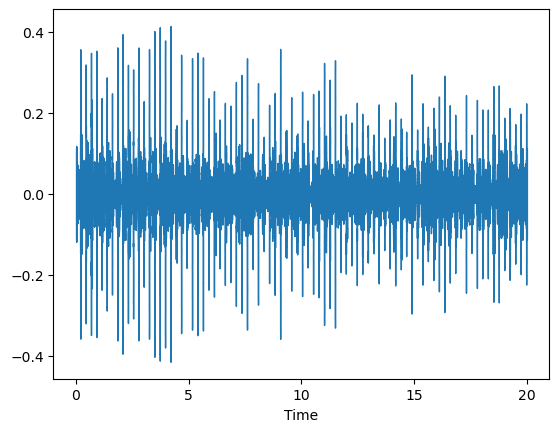

In [16]:
samples, samplingRate = librosa.load('sonido_corazon.wav') #signal and sampling rate
t=np.arange(0, len(samples)/samplingRate, 1.0/samplingRate) # Vector de tiempo
librosa.display.waveshow(samples, sr=samplingRate);
ipd.Audio(samples, rate=samplingRate)

### 3.2 Grafique el espectro de la señal

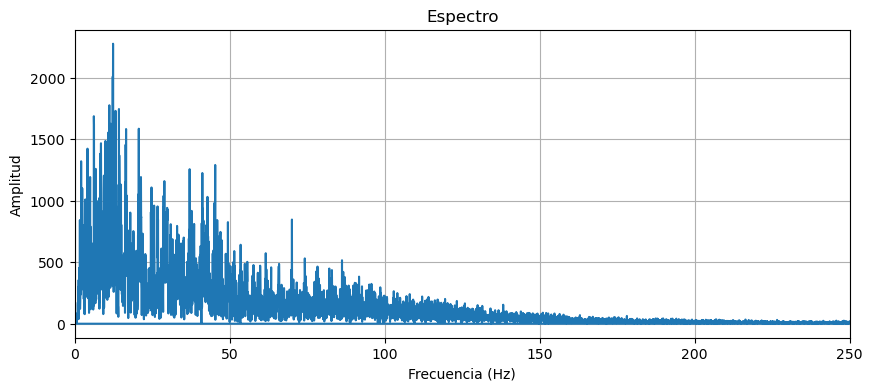

In [17]:
# Calcular la transformada de Fourier
fft = np.fft.fft(samples)
# Calcular las frecuencias correspondientes
frequencies = np.fft.fftfreq(len(samples), 1/samplingRate)

# Obtener la magnitud del espectro
magnitude = np.abs(fft)


# Graficar la transformada de Fourier
plt.figure(figsize=(10, 4))
plt.plot(frequencies, magnitude)
plt.title('Espectro')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Amplitud')
plt.xlim(0, 250) # Mostrar solo las frecuencias positivas hasta la mitad del espectro
plt.grid(True)
plt.show()

En el espectro podemos apreciar que es una señal muy ruidosa y que la mayor cantidad de energia se encuentran en las primeras componentes de frecuencia

### 3.3 Cree un filtro pasa-banda con el metodo que guste pero que cumpla con los siguientes requisitos
* $F_1= $ 100 Hz
* $F_2= $ 2000 Hz
* $F_m = $  10% de la banda pasante

In [18]:
#Creando los parametros para el filtro

nyq_rate = samplingRate / 2 # The Nyquist rate of the signal.
low_cutoff_hz = 2000; # el maximo de frecuencia del sonido respiratorio es de 2000 Hz
high_cutoff_hz = 100; # el minimo de frecuencia del sonido respiratorio es de 100 Hz
passband = (low_cutoff_hz - high_cutoff_hz); # passband
transition = passband * 0.1; # transtion band (heuristically determined 10%-20%)
order = int(3.3 * nyq_rate / transition); # order of the filter (mantener el orden bajo para evitar altas desviaciones)
order = order + 1 if order % 2 == 0 else order; # make sure that the order is odd
print('nyq_rate', nyq_rate, 'low_cutoff_hz', low_cutoff_hz, 'high_cutoff_hz', high_cutoff_hz, 'passband', passband, 'transition', transition, 'order', order);

nyq_rate 11025.0 low_cutoff_hz 2000 high_cutoff_hz 100 passband 1900 transition 190.0 order 191


In [19]:
# Contruyendo los filtros
lowpass = firwin(order, cutoff=low_cutoff_hz/nyq_rate, window=('hamming'));
highpass = firwin(order, cutoff=high_cutoff_hz/nyq_rate, window=('hamming'), pass_zero=False);

### 3.4 Aplique el filtro a la señal original. grafique tanto en el tiempo como en la frecuencia y reproduzca el audio resultante.¿ Que logra apreciar?

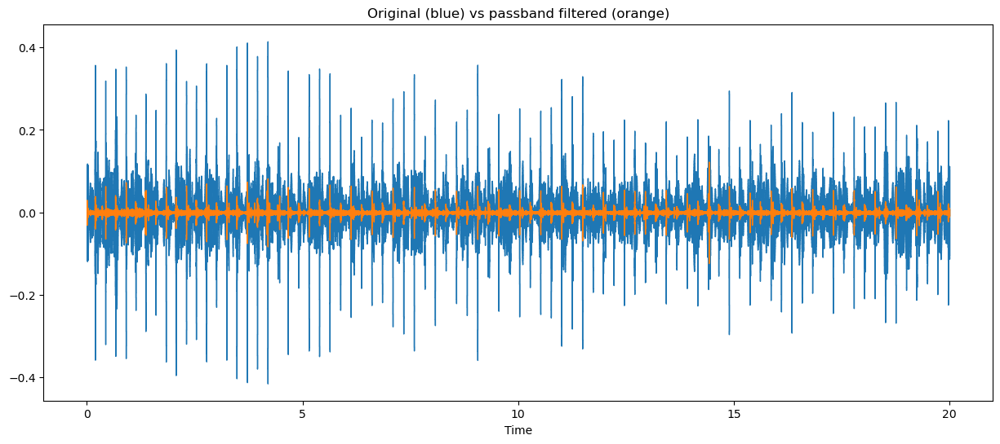

In [20]:

# aplicando pasa banda al audio de prueba
samples_high = sp.filtfilt(highpass, 1, samples);
samples_band = sp.filtfilt(lowpass, 1, samples_high);

samples_band = np.asfortranarray(samples_band);

# graficando el audio de prueba original y el filtrado con el pasa banda.
plt.figure(figsize=(15,6))
librosa.display.waveshow(samples, sr=samplingRate);
librosa.display.waveshow(samples_band, sr=samplingRate);
plt.title('Original (blue) vs passband filtered (orange)');
plt.show();
ipd.Audio(samples_band, rate=samplingRate)

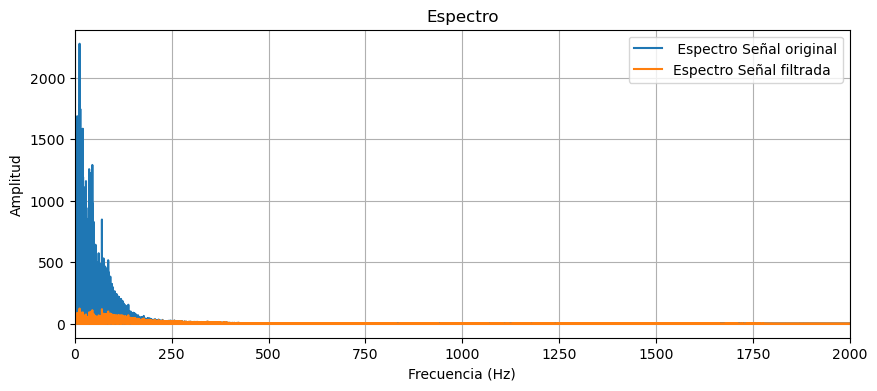

In [21]:
# Calcular la transformada de Fourier
fft1 = np.fft.fft(samples_band)
# Calcular las frecuencias correspondientes
frequencies1 = np.fft.fftfreq(len(samples_band), 1/samplingRate)

# Obtener la magnitud del espectro
magnitude1 = np.abs(fft1)

# Graficar la transformada de Fourier
plt.figure(figsize=(10, 4))
plt.plot(frequencies, magnitude, label=" Espectro Señal original") 
plt.plot(frequencies1, magnitude1, label="Espectro Señal filtrada")

plt.title('Espectro')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Amplitud')
plt.legend(loc="upper right")
plt.xlim(0, 2000) # Mostrar solo las frecuencias positivas hasta la mitad del espectro
plt.grid(True)
plt.show()

Tanto en el audio como en el espectro se logra apreciar una disminucion del sonido de los latidos lo que es acorde con nuestro objetivo de atenuar este sonido

### 3.5 Aplique el filtro wavelet a la señal filtrada, grafique en el tiempo y reproduzca el audio ¿ Que logra apreciar? ¿El proceso de filtrado fue exitoso, segun su criterio?

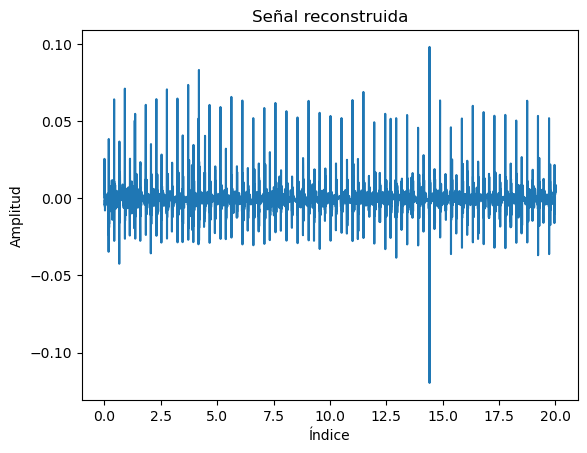

In [22]:
def wnoisest(coeff):
    stdc = np.zeros((len(coeff),1))
    for i in range(0, len(coeff)):
        stdc[i] = (np.median(np.absolute(coeff[i]))) / 0.6745
    return stdc

def threshold(coeff):
    Num_samples = 0
    for i in range(0, len(coeff)):
        Num_samples = Num_samples + coeff[i].shape[0]
    
    thr = np.sqrt(2 * (np.log(Num_samples)))
    return thr

def wthresh(coeff):
    y = []
    s = wnoisest(coeff)
    thr = threshold(coeff)
    for i in range(0, len(coeff)):
        y.append(np.multiply(coeff[i], np.abs(coeff[i]) > (thr * s[i])))
    return thr, s, y

# Código 1 modificado

wavelet = 'db4'
level = 8

# Descomposición wavelet
coeffs = pywt.wavedec(samples_band, wavelet, level=level)

# Llamada a la función wthresh()
thr, s, thresholded_coeffs = wthresh(coeffs[1:])

# Reconstrucción de los coeficientes con el umbral aplicado
coeffs[1:] = thresholded_coeffs

# Reconstrucción de la señal
reconstructed_signal = pywt.waverec(coeffs, wavelet)
# Gráfico de la señal reconstruida
plt.plot(t,reconstructed_signal)
plt.title('Señal reconstruida')
plt.ylabel('Amplitud')
plt.xlabel('Índice')
plt.show()
ipd.Audio(reconstructed_signal, rate=samplingRate)

Se puede decir que el proceso de filtrado fue exitoso, ya que en el audio solo se logra apreciar el sonido principal del corazon.

### 3.6 Reste la señal filtrada con la señal reconstruida, grafique en el tiempo y en la frecuencia y reproduzca el audio

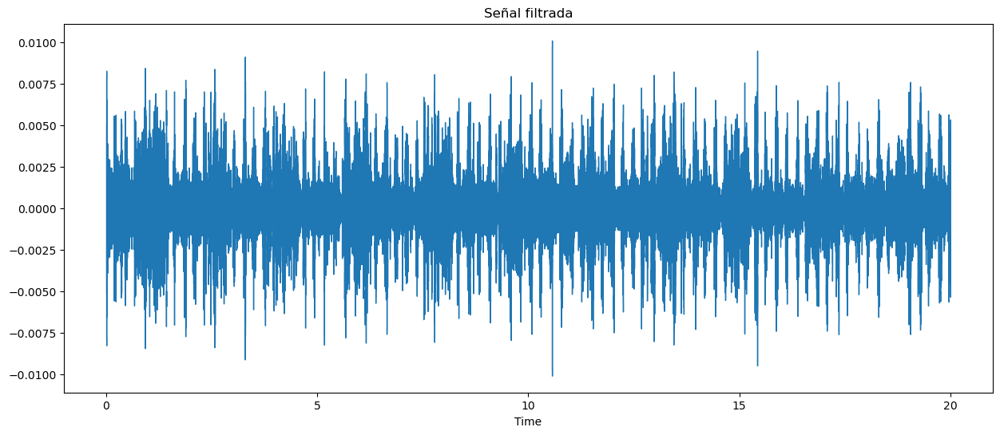

In [23]:
# restamos la señal restaurada con la señal del pasabajas para obtener el "ruido"
samples_filtered = samples_band - reconstructed_signal;
plt.figure(figsize=(15,6))
librosa.display.waveshow(samples_filtered, sr=samplingRate);
plt.title('Señal filtrada')
plt.show();
ipd.Audio(samples_filtered, rate=samplingRate)

Se puede decir que nuestro proceso de filtrado fue exitoso, a pesar de que no se elimino por completo la presencia del sonido del corazon, se realzo lo suficiente el sonido de la respiracion para ser muy entendible y hacer cualquier analisis medico a este.

# 4. Conclusiones

* El filtro wavelet es una técnica eficaz para reducir el ruido en las señales, incluidos los ruidos cardiacos en las señales de respiración. La descomposición wavelet permite separar los diferentes componentes de la señal en diferentes niveles de detalle.
* Al aplicar el umbral a los coeficientes, se eliminan los coeficientes de baja amplitud que se consideran ruido, mientras se conservan los coeficientes significativos que representan la señal de interés.
* El filtrado wavelet puede ser especialmente útil en escenarios donde se requiere una reducción de ruido eficiente sin afectar significativamente la calidad general del audio. Puede ofrecer una mejora perceptible al eliminar ruidos molestos sin causar distorsiones o artefactos notables.
* Es importante realizar una evaluación subjetiva y objetiva de los resultados del filtrado. Esto implica escuchar y analizar el audio filtrado para verificar si se ha logrado una reducción de ruido satisfactoria sin afectar negativamente las características importantes del audio.